# Toxic Comment Classification

## Overview
The goal of the following is to detect toxic comments (i.e. comments that contain threats, obscenity, insults, hate speech, etc.) from Wikipedia's talk page edits. The dataset used is available from the [Perspective API](https://perspectiveapi.com/research/): a collaborative research effort by Jigsaw and Google's Counter Abuse Technology team, who publish datasets, conduct research, and open source code w.r.t. natural language processing and machine learning.

The dataset contains roughly 2 million comments from the Civil Comments platform, and each comment is annotated for toxicity by up to 10 annotators. These annotations were subsequently aggreggated to represent the target variale, which corresponds to a 0.0 - 1.0 float that representes the fraction of annotators who believe that the comment is toxic. A detailed description of the dataset can be found in [Sorensen et al.](https://research.google/pubs/pub48094/)

## Libraries

In [1]:
import numpy as np 
import pandas as pd
from tqdm import tqdm
import os
import matplotlib.pyplot as plt
from multiprocess import Pool, cpu_count
from sklearn.metrics import classification_report, roc_auc_score, matthews_corrcoef, confusion_matrix

from tensorflow.keras.layers import Embedding, Dropout, Dense, Conv1D
from tensorflow.keras.layers import MaxPooling1D, GlobalAveragePooling1D, LeakyReLU
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.metrics import BinaryAccuracy, AUC
from tensorflow.keras.callbacks import ModelCheckpoint, TensorBoard, EarlyStopping, ReduceLROnPlateau

import config
import utils
import embeddings

## Light EDA

Let's have a look at the dataset:

In [3]:
df = pd.read_csv('./train.csv', usecols = ['comment_text', 'target'])
df.sample(5)

,target,comment_text
733929,0.000000,Wet noodle lashing.
1161677,0.200000,You must be a Ryerson journalism graduate beca...
1735373,0.000000,What HAPPEND to Californias threat to SECEDE f...
1339087,0.000000,The Magnolia Brew Pub is just as hippy as you ...
1152235,0.673077,"Trudeau, you terrorist sympathizer...."


According to the dataset description, target values range between 0.0 and 1.0, and they represent the fraction of raters who believed the label fit the comment. We will treat this as a binary classification problem with targets having a value higher than or equal to 0.5 being considered toxic comments:

In [4]:
df['target'] = list(map(lambda target: 1 if target >= 0.5 else 0, df['target'].values))

In [5]:
print('No samples:', df.shape[0])
print('Positive samples [% of all]:', round(np.sum(df['target'].values) / df.shape[0] * 100, 2))

No samples: 1804874
Positive samples [% of all]: 8.0


1.8 million samples, 8% of which are toxic. Let's have a look at a few examples:

In [6]:
print('=========== Normal comments =============')
for idx, s in df['comment_text'][df['target'] == 0].sample(1).items():
    print(s, end = '\n\n')

print('=========== Toxic comments =============')
for idx, s in df['comment_text'][df['target'] == 1].sample(1).items():
    print(s, end = '\n\n')

=========== Normal comments =============
Only one more to go.

=========== Toxic comments =============
Well I guess we ain't pulling no one out of Afghanistan.  What a loser.  Nothing but fake promises and I thought he had all the facts before making crucial statements and condemning the former administration.



Some statistics on the length (no. words) of the comments:

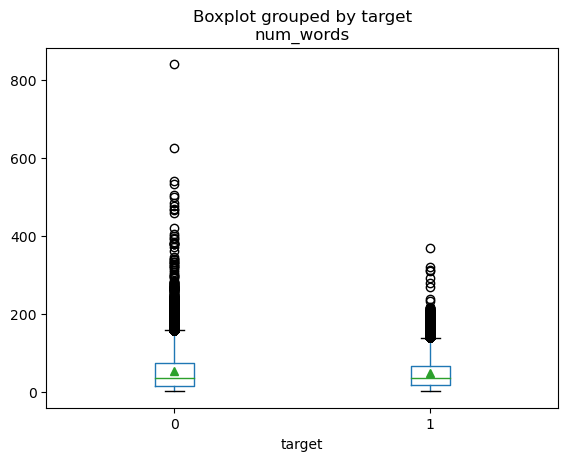

In [7]:
df['num_words'] = df['comment_text'].str.split(' ').str.len()
df.boxplot(column = 'num_words', by = 'target', grid = False, showmeans = True);

In [8]:
print('Mean number of words per comment:', df['num_words'].mean().round(2))
print('Median number of words per comment:', df['num_words'].median().round(2))
print('Min number of words per comment:', df['num_words'].min())
print('Max number of words per comment:', df['num_words'].max())

Mean number of words per comment: 51.86
Median number of words per comment: 35.0
Min number of words per comment: 1
Max number of words per comment: 841


## Preprocessing

The preprocessing pipeline for the comments consists of the following steps:
* Removal of URLs
* Removal of HTML tags
* Conversion of emoticons to words
* Conversion of emojis to words
* Conversion of abbreviations (e.g. lol, cy) to words
* Contractions expansion
* Coversion of digits to words
* Conversion of accented characters to latin
* Lowercasing
* Punctuation and stopword removal
* Correction of misspelled words

All the above steps are performed in the preprocessing module, wrapped in the preprocessChunk() function below, which operates in parallel on subsets (chunks) of the dataset.

In [9]:
%%writefile chunkProcessor.py # the multiprocess package requires writing the function to a file

def preprocessChunk(df, textCol:str = 'comment_text'):
    '''  Preprocessing pipeline to normalize the comment texts. '''

    import pandas as pd
    from preprocessing import preprocess

    for idx, row in df.iterrows():
        text = row[textCol]                     # Grab text in row
        df.at[idx, textCol] = preprocess(text)  # Replace it with the processed one
    
    return df

Overwriting chunkProcessor.py


In [10]:
from chunkProcessor import preprocessChunk

# Split the df into chunks to process in parallel
noCPUs    = cpu_count() - 1
chunkSz   = 50000
chunks    = [df.iloc[df.index[i:i + chunkSz]] for i in range(0, df.shape[0], chunkSz)]

# Run preprocessing pipeline
with Pool(noCPUs) as p:
    chunksProcessed = list( tqdm(p.imap(preprocessChunk, chunks), total = len(chunks)) )

# Make file
df = pd.concat(chunksProcessed, axis = 0)
df['num_words'] = df['comment_text'].str.split(' ').str.len()
df.to_csv('./trainProcessed.csv')

100%|██████████| 37/37 [9:08:54<00:00, 890.13s/it]


Now we need to split the data in the various subsets, retain the most frequent words, and convert the comments to sequences:

In [ ]:
# Read file
df = pd.read_csv('./trainProcessed.csv', index_col = 0)

# Split train, validation, test sets
Xl, Xv, Xt, yl, yv, yt = utils.split(X = df['comment_text'].astype(str).values, 
                                     y = df['target'].values)

# Get word frequencies and top <NUM_FEATURES> frequent words on the learning set
wordCounts    = utils.countWords(Xl)
frequentWords = set(sorted(wordCounts, key = wordCounts.get, reverse = True)[:config.NUM_FEATURES])

# Remove rare words from the learning set
Xl = utils.filterWords(corpus = Xl, wordDict = frequentWords)

# Drop any empty training samples (might occur due to the filtering above)
idxKeep = np.array([len(text) != 0 for text in Xl])
Xl, yl  = Xl[idxKeep], yl[idxKeep]

# Convert to sequences
vec = utils.Vectorizer(sequenceLength = config.MAX_SEQUENCE_LENGTH)

vec.fitOnTexts(Xl)
Xl = vec.textsToSequences(Xl)
Xv = vec.textsToSequences(Xv)
Xt = vec.textsToSequences(Xt)

The last preprocessing step needed is to prepare the matrix with the word embeddings that will be used on the embedding layer of the network. The matrix contains the pretrained embeddings that will be used, with an embedding dimension of 300:

In [ ]:
embeddingMatrix = embeddings.generate(
                    vocabularyDict = vec.getVocabulary(),
                    embeddingFile  = config.EMBEDDING_FILE,
                    embeddingDim   = config.EMBEDDING_DIMENSION)

## Modelling

A 1D CNN will be used for the task with the following architecture:

* Embedding layer, 
* X blocks of: (Dropout -> 2x 1D Conv. -> Max pooling),
* 1 block of:  (Dropout -> 2x 1D Conv. -> Global average pooling),
* Dense layer,
* Classifier head

The optimizer will be Adam with binary cross entropy loss:


In [41]:
""" Build model """

# Indicator whether or not blockNum corresponds to the last block of the model
isLast = lambda blockNum: blockNum == config.BLOCKS - 1 
model  = Sequential()

model.add(Embedding(
            input_dim    = embeddingMatrix.shape[0], # vocabulary size
            output_dim   = embeddingMatrix.shape[1], # embedding dimension
            input_length = config.MAX_SEQUENCE_LENGTH,
            trainable    = config.EMBEDDING_TRAINABLE,
            weights      = [embeddingMatrix]))

for block in range(config.BLOCKS):
    
    model.add(Dropout(rate = config.DROPOUT_RATE))
    model.add(Conv1D(
                filters     = config.FILTERS[block],
                kernel_size = config.KERNEL_SIZE,
                activation  = None,
                padding     = 'same'))
    model.add(LeakyReLU(alpha = config.LRELU_ALPHA))
    model.add(Conv1D(
                filters     = config.FILTERS[block],
                kernel_size = config.KERNEL_SIZE,
                activation  = None,
                padding     = 'same'))
    model.add(LeakyReLU(alpha = config.LRELU_ALPHA))

    if isLast(block): model.add(GlobalAveragePooling1D())
    else:             model.add(MaxPooling1D(config.POOL_SIZE))

model.add(Dropout(rate = config.DROPOUT_RATE))
model.add(Dense(activation = None,  units = config.DENSE_UNITS))
model.add(LeakyReLU(alpha = config.LRELU_ALPHA))
model.add(Dense(activation = 'sigmoid',  units = 1))

""" Compile model """
model.compile(
    optimizer = Adam(learning_rate = config.LEARN_RATE),
    metrics   = [BinaryAccuracy(name = 'acc'), AUC(name = 'auc')],
    loss      = 'binary_crossentropy')

model.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_2 (Embedding)      (None, 250, 50)           1000100   
_________________________________________________________________
dropout_10 (Dropout)         (None, 250, 50)           0         
_________________________________________________________________
conv1d_16 (Conv1D)           (None, 250, 16)           2416      
_________________________________________________________________
leaky_re_lu_18 (LeakyReLU)   (None, 250, 16)           0         
_________________________________________________________________
conv1d_17 (Conv1D)           (None, 250, 16)           784       
_________________________________________________________________
leaky_re_lu_19 (LeakyReLU)   (None, 250, 16)           0         
_________________________________________________________________
max_pooling1d_6 (MaxPooling1 (None, 83, 16)           

Let's define the necessary callbacks and start the training process:

In [5]:
callbacks = [
    ModelCheckpoint(config.CHECKPOINT_DIR),
    TensorBoard(
        log_dir     = os.path.join("logs", "train"),
        write_graph = False),
    ReduceLROnPlateau(
        factor   = config.LR_PLATEAU_FACTOR, 
        patience = config.LR_PLATEAU_PATIENCE,
        min_lr   = config.LR_PLATEAU_MIN,
        monitor  = "val_loss",
        verbose  = 0)]

%load_ext tensorboard
%tensorboard --logdir logs # http://localhost:6006/

history = model.fit(
    x = Xl, y = yl,
    validation_data = (Xv, yv),
    callbacks       = callbacks,
    batch_size      = config.BATCH_SIZE,
    epochs          = config.EPOCHS,
    class_weight    = config.CLASS_WEIGHTS,
    verbose         = 1,
    use_multiprocessing = True)

Launching TensorBoard...

Train on 1262413 samples, validate on 270731 samples
Epoch 1/30
1262413/1262413 [==============================] - 87s 69us/sample - loss: 0.7606 - acc: 0.7803 - auc: 0.9019 - val_loss: 0.2829 - val_acc: 0.8720 - val_auc: 0.9367
Epoch 2/30
1262413/1262413 [==============================] - 83s 66us/sample - loss: 0.6623 - acc: 0.8321 - auc: 0.9263 - val_loss: 0.2400 - val_acc: 0.9012 - val_auc: 0.9400
Epoch 3/30
1262413/1262413 [==============================] - 83s 66us/sample - loss: 0.6385 - acc: 0.8381 - auc: 0.9315 - val_loss: 0.2225 - val_acc: 0.9173 - val_auc: 0.9417
Epoch 4/30
1262413/1262413 [==============================] - 83s 66us/sample - loss: 0.6265 - acc: 0.8414 - auc: 0.9340 - val_loss: 0.2021 - val_acc: 0.9202 - val_auc: 0.9400
Epoch 5/30
1262413/1262413 [==============================] - 83s 66us/sample - loss: 0.6187 - acc: 0.8442 - auc: 0.9357 - val_loss: 0.2196 - val_acc: 0.9197 - val_auc: 0.9421
Epoch 6/30
1262413/1262413 [==============================] - 84s 6

Let's check the performance on the test set:

In [13]:
yhat = model.predict(Xt) > 0.5
cm    = confusion_matrix(yt, yhat)
auroc = np.round(roc_auc_score(yt, yhat), 2)
mcc   = np.round(matthews_corrcoef(yt, yhat), 2)

print('Test set prediction stats')
print('-------------------------')

print('TP    = ', cm[0][0])
print('FP    = ', cm[0][1])
print('FN    = ', cm[1][0])
print('TN    = ', cm[1][1], end = '\n\n')
print('AUROC = ', auroc)
print('MCC   = ', mcc, end = '\n\n')
print(classification_report(yt, yhat))


Test set prediction stats
-------------------------
TP    =  245077
FP    =  4005
FN    =  2506
TN    =  19144

AUROC =  0.93
MCC   =  0.84

              precision    recall  f1-score   support

           0       0.99      0.98      0.99    249082
           1       0.83      0.88      0.85     21650

    accuracy                           0.98    270732
   macro avg       0.91      0.93      0.92    270732
weighted avg       0.98      0.98      0.98    270732

